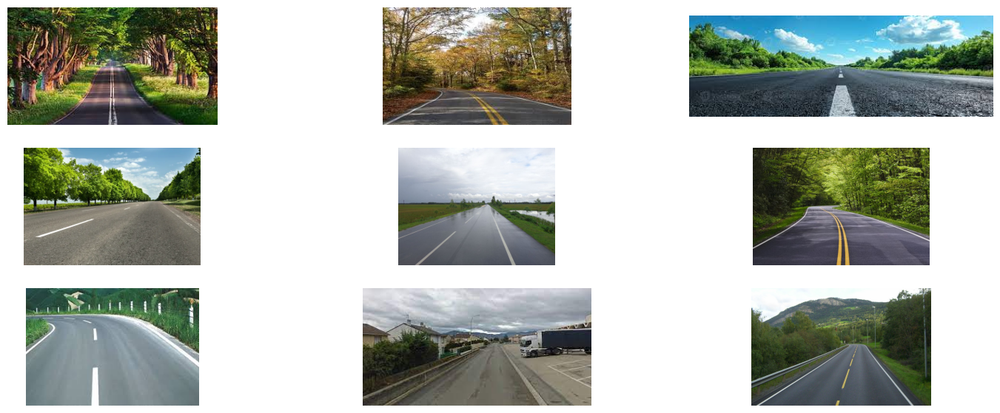

In [ ]:

from matplotlib import pyplot
from matplotlib.image import imread
folder = 'Dataset/'
pyplot.figure(figsize=(17, 7))
for i in range(9):
    pyplot.subplot(330 + 1 + i)
    pyplot.axis('off')
    filename = folder + 'normal00' + str(i+1) + '.jpg'
    image = imread(filename)
    pyplot.imshow(image)
pyplot.show()

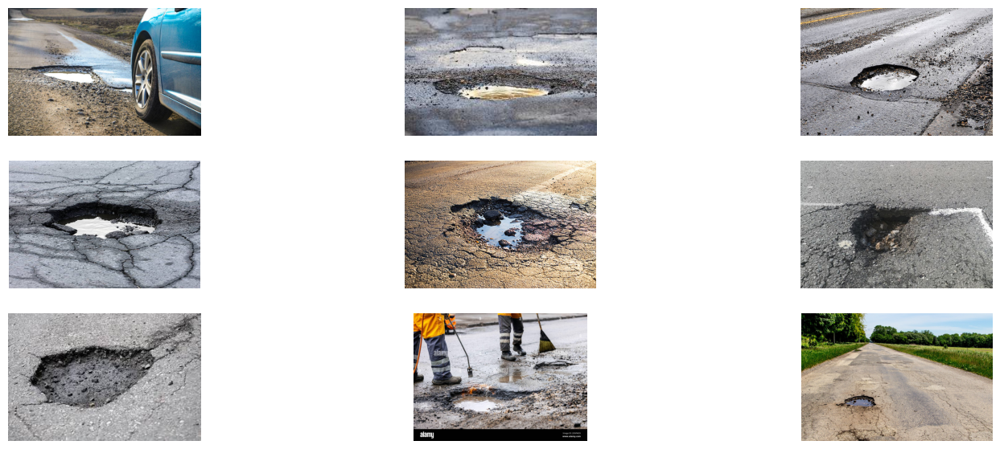

In [ ]:
pyplot.figure(figsize=(17, 7))
for i in range(9):
    pyplot.subplot(330 + 1 + i)
    pyplot.axis('off')
    filename = folder + 'pothole00' + str(i+1) + '.jpg'
    image = imread(filename)
    pyplot.imshow(image)

pyplot.show()

In [3]:
# load the dataset to check for invalid images
from os import listdir
from tensorflow.keras.preprocessing.image import load_img
# define location of dataset
folder = 'Dataset/'
# List for Invalid Images
invalid_imgs = []
# enumerate files in the directory
for file in listdir(folder):
    try:
        # load image
        photo = load_img(folder + file, target_size=(200, 200))
    except:
        print(file)
        invalid_imgs.append(file)
        pass

ModuleNotFoundError: No module named 'tensorflow'

## Pre-process photos into standard directories

In [ ]:
from os import makedirs, listdir
from shutil import copyfile
from random import seed, random

# Create directories
dataset_home = 'dataset_pothole_detection/'
subdirs = ['train/', 'test/']
for subdir in subdirs:
    # Create label subdirectories
    labeldirs = ['normal/', 'pothole/']
    for labeldir in labeldirs:
        newdir = dataset_home + subdir + labeldir
        makedirs(newdir, exist_ok=True)

# Seed RNG
seed(2020)
# define ratio of pictures to use for validation
val_ratio = 0.20
# copy training daataset images into subdirectories
src_directory = 'Dataset/'
for file in listdir(src_directory):
    if file not in invalid_imgs:
        src = src_directory + '/' + file
        dest_dir = subdirs[0] # train folder
        if random() < val_ratio:
            dest_dir = subdirs[1] # test folder
        if file.startswith('normal'):
            dest = dataset_home + dest_dir + labeldirs[0] + file
            copyfile(src, dest)
        elif file.startswith('pothole'):
            dest = dataset_home + dest_dir + labeldirs[1] + file
            copyfile(src, dest)

NameError: name 'invalid_imgs' is not defined

# Tensorflow Image Classifier

In [42]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, Dropout, MaxPooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array

import os
import numpy as np
import matplotlib.pyplot as plt

from sklearn import metrics

Assign variables for proper file path of training and validation set

In [6]:
PATH = os.getcwd() + '/dataset_pothole_detection'
train_dir = os.path.join(PATH, 'train')
validation_dir = os.path.join(PATH, 'test')

In [7]:
train_normal_dir = os.path.join(train_dir, 'normal')  # directory with our training images of normal roads
train_pothole_dir = os.path.join(train_dir, 'pothole')  # directory with our training images of roads with pothole
validation_normal_dir = os.path.join(validation_dir, 'normal')  # directory with our validation images of normal roads
validation_pothole_dir = os.path.join(validation_dir, 'pothole')  # directory with our validation images of roads with pothole

**Understand the data**

In [8]:
num_normal_tr = len(os.listdir(train_normal_dir))
num_pothole_tr = len(os.listdir(train_pothole_dir))

num_normal_val = len(os.listdir(validation_normal_dir))
num_pothole_val = len(os.listdir(validation_pothole_dir))

total_train = num_normal_tr + num_pothole_tr
total_val = num_normal_val + num_pothole_val

In [9]:
print('total training Normal road images:', num_normal_tr)
print('total training Pothole images:', num_pothole_tr)

print('total validation Normal road images:', num_normal_val)
print('total validation Pothole images:', num_pothole_val)
print("--")
print("Total training images:", total_train)
print("Total validation images:", total_val)

total training Normal road images: 284
total training Pothole images: 259
total validation Normal road images: 55
total validation Pothole images: 60
--
Total training images: 543
Total validation images: 115


In [10]:
# Set up variables to use while pre-processing and traing the network
batch_size = 16
epochs = 25
IMG_HEIGHT = 250
IMG_WIDTH = 250

## Data Preparation

In [11]:
train_image_generator = ImageDataGenerator(rescale=1./255) # Generator for our training data
validation_image_generator = ImageDataGenerator(rescale=1./255) # Generator for our validation data
# NOTE: rescale=1./255 converts RGB values of (0 to 255) to (0 to 1)

In [12]:
train_data_gen = train_image_generator.flow_from_directory(batch_size=batch_size,
                                                           directory=train_dir,
                                                           shuffle=True,
                                                           target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                           class_mode='binary')

Found 543 images belonging to 2 classes.


In [13]:
val_data_gen = validation_image_generator.flow_from_directory(batch_size=batch_size,
                                                              directory=validation_dir,
                                                              target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                              class_mode='binary')

Found 115 images belonging to 2 classes.


## Visualize training images

In [14]:
sample_training_images, _ = next(train_data_gen)

The `next` function returns a batch from the dataset. The return value of `next` function is in form of `(x_train, y_train)` where x_train is training features and y_train, its labels. Discard the labels to only visualize the training images.

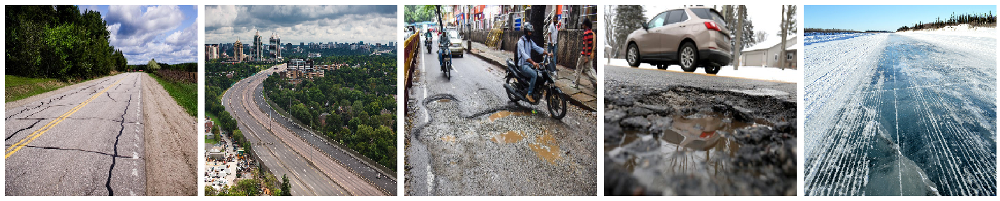

In [ ]:
# This function will plot images in the form of a grid with 1 row and 5 columns where images are placed in each column.
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 5, figsize=(20,20))
    axes = axes.flatten()
    for img, ax in zip( images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

plotImages(sample_training_images[:5])

## Create the Model
The model consists of three convolution blocks with a max pool layer in each of them. There's a fully connected layer with 512 units on top of it that is activated by a `relu` activation function.

In [16]:
model = Sequential([
    Conv2D(16, 3, padding='same', activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH ,3)),
    MaxPooling2D(),
    Conv2D(32, 3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(64, 3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(128, 3, padding='same', activation='relu'), # New Convolution layer
    MaxPooling2D(),
    Flatten(),
    Dense(512, activation='relu'),
    Dense(1)
])

## Compile the model
Using the *RMSprop* optimizer and binary cross entropy loss function. To view training and validation accuracy for each training epoch, pass the `metrics` argument.

In [17]:
model.compile(optimizer='rmsprop',
              loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              metrics=['accuracy'])

## Model summary

In [18]:
model.summary() # View all the layers of the network

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 250, 250, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 125, 125, 16)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 125, 125, 32)      4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 62, 62, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 62, 62, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 31, 31, 64)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 31, 31, 128)       7

## Train the model
Use the `fit_generator` method of the `ImageDataGenerator` class to train the network.

In [19]:
history = model.fit_generator(
    train_data_gen,
    steps_per_epoch=total_train // batch_size,
    epochs=epochs,
    validation_data=val_data_gen,
    validation_steps=total_val // batch_size
)

Epoch 1/25
33/33 [==============================] - 29s 874ms/step - loss: 0.9251 - accuracy: 0.5313 - val_loss: 0.6034 - val_accuracy: 0.4911
Epoch 2/25
33/33 [==============================] - 27s 808ms/step - loss: 0.6262 - accuracy: 0.6338 - val_loss: 0.4882 - val_accuracy: 0.7768
Epoch 3/25
33/33 [==============================] - 27s 813ms/step - loss: 0.5543 - accuracy: 0.7178 - val_loss: 0.4094 - val_accuracy: 0.7679
Epoch 4/25
33/33 [==============================] - 25s 749ms/step - loss: 0.3896 - accuracy: 0.8368 - val_loss: 0.3326 - val_accuracy: 0.8304
Epoch 5/25
33/33 [==============================] - 25s 767ms/step - loss: 0.4530 - accuracy: 0.8292 - val_loss: 0.3747 - val_accuracy: 0.8036
Epoch 6/25
33/33 [==============================] - 25s 746ms/step - loss: 0.3775 - accuracy: 0.8650 - val_loss: 0.2928 - val_accuracy: 0.8750
Epoch 7/25
33/33 [==============================] - 26s 791ms/step - loss: 0.2423 - accuracy: 0.9053 - val_loss: 0.3087 - val_accuracy: 0.8482

## Visualize training results

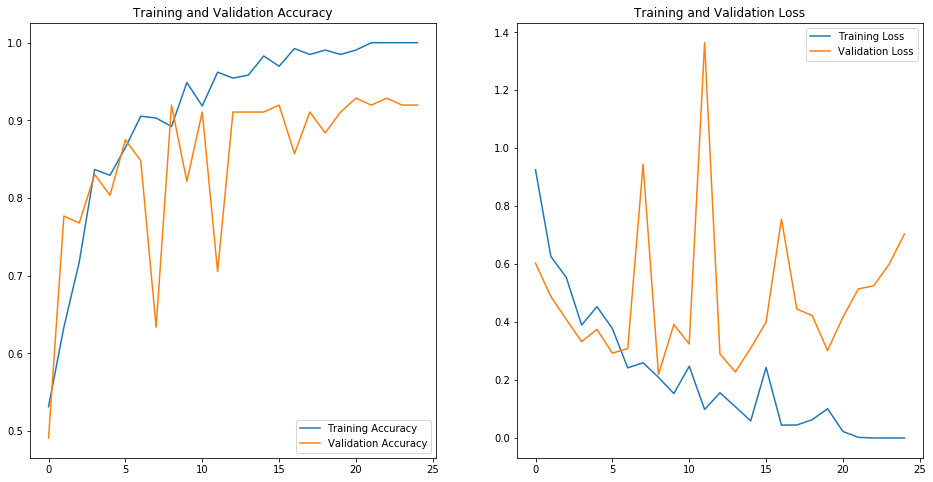

In [20]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

# Save the model
model.save('model_noDroput_'+str(format(val_acc[-1], '.3f'))+'.h5')

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

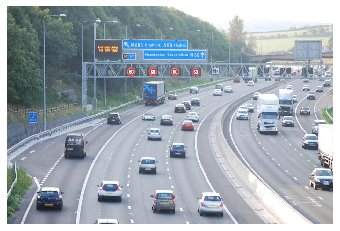

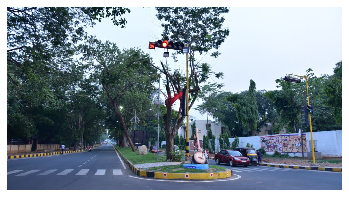

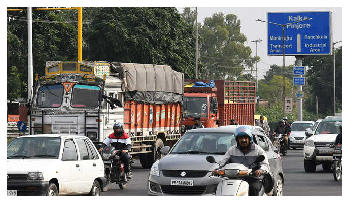

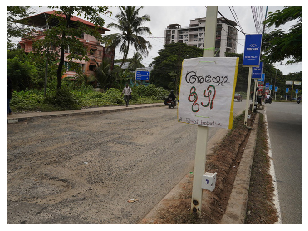

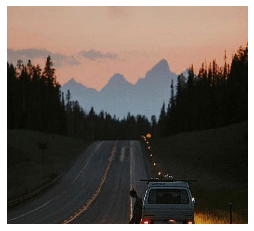

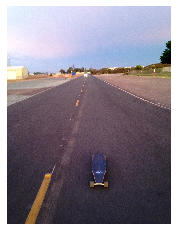

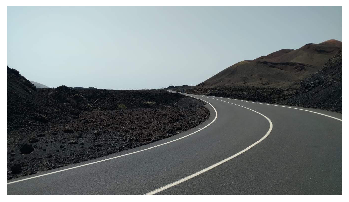

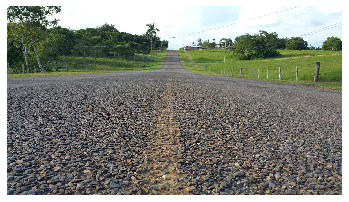

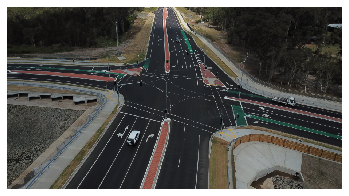

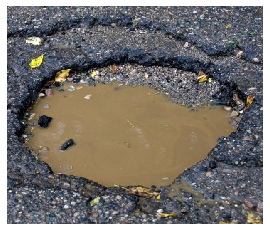

              precision    recall  f1-score   support

      normal       0.98      0.84      0.90        55
     pothole       0.87      0.98      0.92        60

    accuracy                           0.91       115
   macro avg       0.92      0.91      0.91       115
weighted avg       0.92      0.91      0.91       115



In [ ]:
# predictions = model.predict(val_data_gen, steps=val_data_gen.samples // batch_size + 1)
# # Get most likely class
# predicted_classes = np.argmax(predictions, axis=-1)
import os
true_classes = val_data_gen.classes
class_labels = list(val_data_gen.class_indices.keys())

def predict_image(imgPath):
    predictImage = load_img(imgPath, target_size=(IMG_HEIGHT, IMG_WIDTH))
    predictImage = img_to_array(predictImage)
    predictImage = np.expand_dims(predictImage, axis=0)
    result = model.predict_classes(predictImage)
    #result = model.predict_classes(predictImage) # To predict using the older model with no data augmentation and dropouts
    return int(result[0])

predicted_classes = []
i = 0
src_directory = 'dataset_pothole_detection/test/'
for dirname, _, files in os.walk(src_directory):
    for file in files:
        imgPath = os.path.join(dirname, file)
        predicted_classes.append(predict_image(imgPath))
        if (predict_image(imgPath) != true_classes[i]):
            img = imread(imgPath)
            plt.imshow(img)
            plt.axis('off')
            plt.show()
        i += 1

report = metrics.classification_report(true_classes, predicted_classes, target_names=class_labels)
print(report)

In [48]:
report = metrics.confusion_matrix(true_classes, predicted_classes, labels=[0, 1])
print(report)

[[46  9]
 [ 1 59]]


## Overfitting
In the plots above, the training accuracy is increasing linearly over time to 100% accuracy, but validation accuracy stalls around 85% in the training process. Also, the difference in accuracy between training and validation accuracy is noticeable—this is a sign of *overfitting*.

When there are a small number of training examples, the model sometimes learns from noises or unwanted details from training examples—to an extent that it negatively impacts the performance of the model on new examples. This phenomenon is known as overfitting. `It means that the model will have a difficult time generalizing on a new dataset.`

There are multiple ways to fight overfitting in the training process. We will use *data augmentation* and add *dropout* to our model.

## Data Augmentation
Overfitting generally occurs when there are a small number of training examples. One way to fix this problem is to augment the dataset so that it has a sufficient number of training examples. **`Data augmentation`**` takes the approach of generating more training data from existing training samples by augmenting the samples using random transformations that yield believable-looking images.` The goal is the model will never see the exact same picture twice during training. This helps expose the model to more aspects of the data and generalize better.

In [50]:
# Apply Horizontal flip
image_gen = ImageDataGenerator(rescale=1./255, horizontal_flip=True)
train_data_gen = image_gen.flow_from_directory(batch_size=batch_size,
                                               directory=train_dir,
                                               shuffle=True,
                                               target_size=(IMG_HEIGHT, IMG_WIDTH))

Found 543 images belonging to 2 classes.


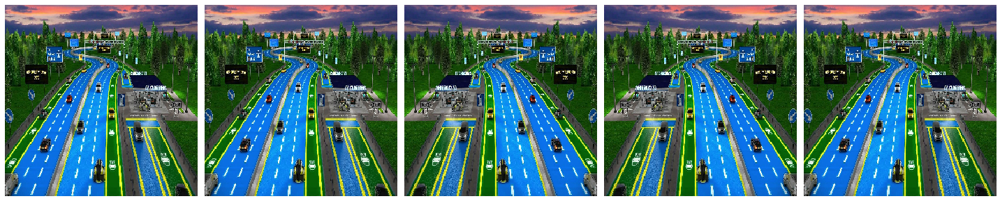

In [ ]:
# Take one sample image from the training examples and repeat it five times
# so that the augmentation is applied to same image five times
augmented_images = [train_data_gen[0][0][0] for i in range(5)]
# Re-use the same custom plotting function defined and used
# above to visualize the training images
plotImages(augmented_images)

Found 543 images belonging to 2 classes.


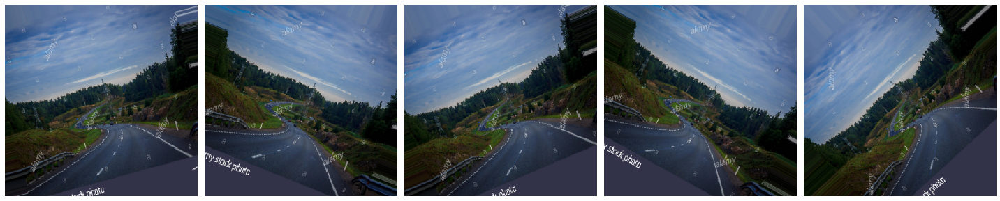

In [52]:
# Randomly rotate the Image
image_gen = ImageDataGenerator(rescale=1./255, rotation_range=45)
train_data_gen = image_gen.flow_from_directory(batch_size=batch_size,
                                               directory=train_dir,
                                               shuffle=True,
                                               target_size=(IMG_HEIGHT, IMG_WIDTH))

augmented_images = [train_data_gen[0][0][0] for i in range(5)]
plotImages(augmented_images)

Found 543 images belonging to 2 classes.


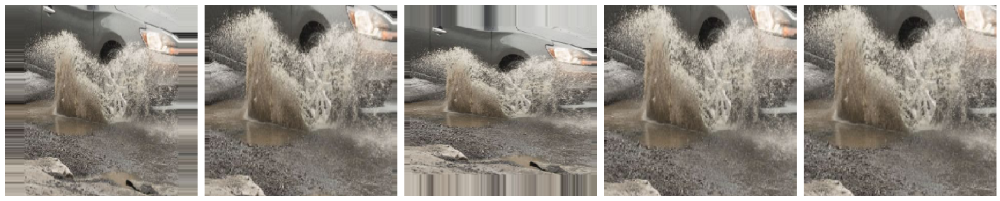

In [53]:
# Zoom augmentation
image_gen = ImageDataGenerator(rescale=1./255, zoom_range=0.3) # randomly zoom images upto 30%
train_data_gen = image_gen.flow_from_directory(batch_size=batch_size,
                                               directory=train_dir,
                                               shuffle=True,
                                               target_size=(IMG_HEIGHT, IMG_WIDTH))

augmented_images = [train_data_gen[0][0][0] for i in range(5)]
plotImages(augmented_images)

In [54]:
# Apply all previous augmentations along with width shift and height shift
image_gen_train = ImageDataGenerator(
                    rescale=1./255,
                    rotation_range=45,
                    shear_range=0.3,
                    width_shift_range=.15,
                    height_shift_range=.15,
                    horizontal_flip=True,
                    zoom_range=0.3
                    )

In [55]:
train_data_gen = image_gen_train.flow_from_directory(batch_size=batch_size,
                                                     directory=train_dir,
                                                     shuffle=True,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     class_mode='binary')

Found 543 images belonging to 2 classes.


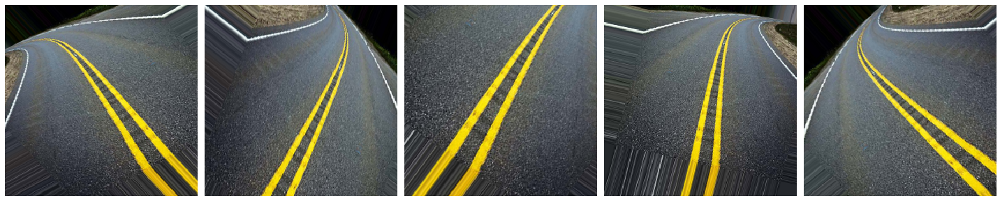

In [56]:
augmented_images = [train_data_gen[0][0][0] for i in range(5)]
plotImages(augmented_images)

In [57]:
# Validation data generator is same as before without any augmentations
image_gen_val = ImageDataGenerator(rescale=1./255)
val_data_gen = image_gen_val.flow_from_directory(batch_size=batch_size,
                                                 directory=validation_dir,
                                                 target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                 class_mode='binary')

Found 115 images belonging to 2 classes.


# Dropout
Another technique to reduce overfitting is to introduce *dropout* to the network. It is a form of *regularization* that forces the weights in the network to take only small values, which makes the distribution of weight values more regular and the network can reduce overfitting on small training examples.

When you apply dropout to a layer it randomly drops out (set to zero) number of output units from the applied layer during the training process. Dropout takes a fractional number as its input value, in the form such as 0.1, 0.2, 0.4, etc. This means dropping out 10%, 20% or 40% of the output units randomly from the applied layer.

When applying 0.1 dropout to a certain layer, it randomly kills 10% of the output units in each training epoch.

## Creating a new network with Dropouts

In [ ]:
# Apply a 20% Dropout to first and last max pool layers
model_new = Sequential([
    Conv2D(16, 3, padding='same', activation='relu',
           input_shape=(IMG_HEIGHT, IMG_WIDTH ,3)),
    MaxPooling2D(),
    Dropout(0.2),
    Conv2D(32, 3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(64, 3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(128, 3, padding='same', activation='relu'),
    MaxPooling2D(),
    Dropout(0.2),
    Flatten(),
    Dense(512, activation='relu'),
    Dense(1)
])

## Compile the new model with Dropouts

In [59]:
model_new.compile(optimizer='adam',
                  loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
                  metrics=['accuracy'])

model_new.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 250, 250, 16)      448       
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 125, 125, 16)      0         
_________________________________________________________________
dropout (Dropout)            (None, 125, 125, 16)      0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 125, 125, 32)      4640      
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 62, 62, 32)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 62, 62, 64)        18496     
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 31, 31, 64)       

In [60]:
# Summary of previous model without Dropouts for comparision
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 250, 250, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 125, 125, 16)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 125, 125, 32)      4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 62, 62, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 62, 62, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 31, 31, 64)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 31, 31, 128)       7

## Train the new Model

In [61]:
history = model_new.fit_generator(
    train_data_gen,
    steps_per_epoch=total_train // batch_size,
    epochs=epochs,
    validation_data=val_data_gen,
    validation_steps=total_val // batch_size
)

Epoch 1/25
33/33 [==============================] - 29s 871ms/step - loss: 0.7929 - accuracy: 0.5408 - val_loss: 0.5143 - val_accuracy: 0.5089
Epoch 2/25
33/33 [==============================] - 29s 868ms/step - loss: 0.6927 - accuracy: 0.5484 - val_loss: 0.6883 - val_accuracy: 0.4732
Epoch 3/25
33/33 [==============================] - 28s 845ms/step - loss: 0.6837 - accuracy: 0.5294 - val_loss: 0.6453 - val_accuracy: 0.4732
Epoch 4/25
33/33 [==============================] - 28s 839ms/step - loss: 0.5631 - accuracy: 0.6319 - val_loss: 0.4338 - val_accuracy: 0.7857
Epoch 5/25
33/33 [==============================] - 28s 845ms/step - loss: 0.4591 - accuracy: 0.7875 - val_loss: 0.3521 - val_accuracy: 0.8571
Epoch 6/25
33/33 [==============================] - 28s 850ms/step - loss: 0.3854 - accuracy: 0.8368 - val_loss: 0.3441 - val_accuracy: 0.8839
Epoch 7/25
33/33 [==============================] - 28s 835ms/step - loss: 0.3885 - accuracy: 0.8273 - val_loss: 0.3471 - val_accuracy: 0.8036

## Visualize the model

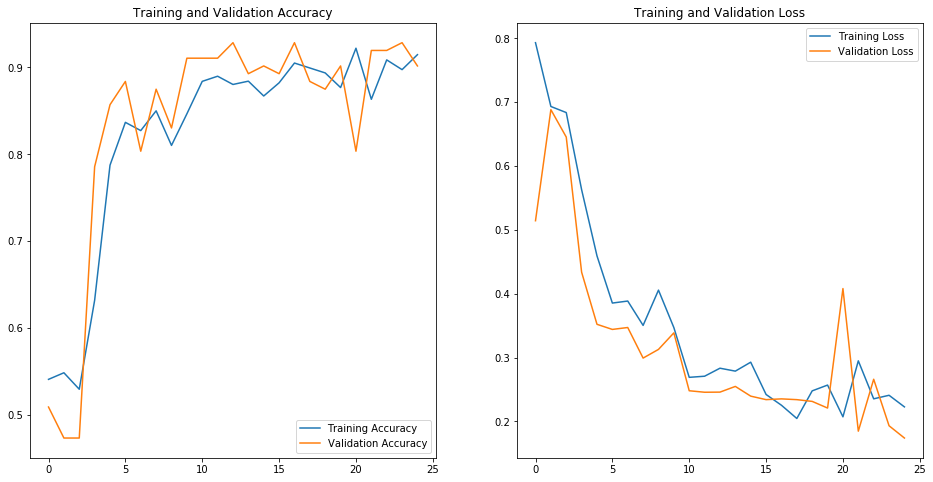

In [62]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [63]:
model_new.save('model_'+str(format(val_acc[-1], '.3f'))+'.h5')

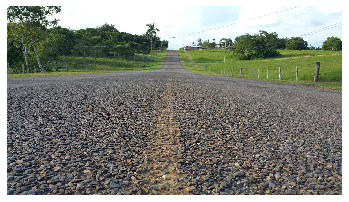

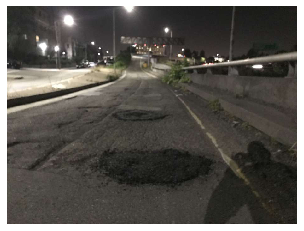

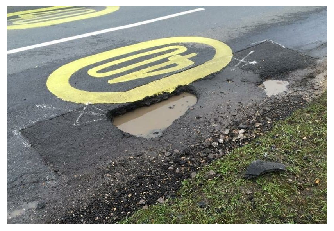

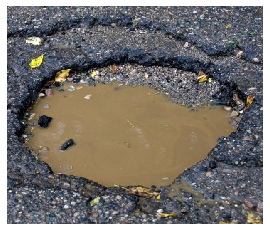

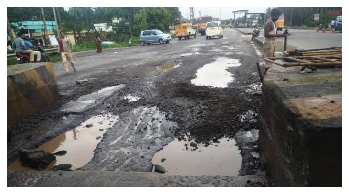

...

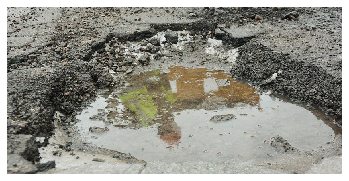

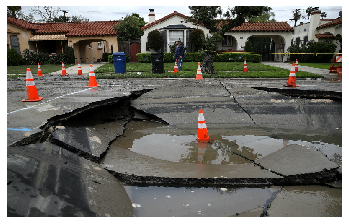

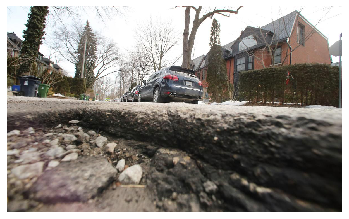

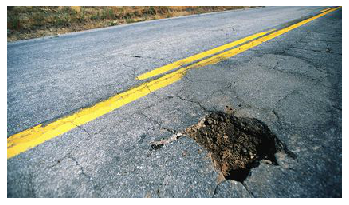

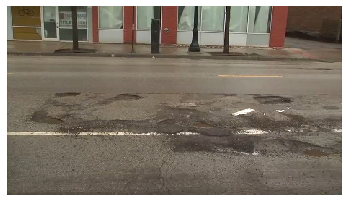

              precision    recall  f1-score   support

      normal       0.78      0.98      0.87        55
     pothole       0.98      0.75      0.85        60

    accuracy                           0.86       115
   macro avg       0.88      0.87      0.86       115
weighted avg       0.88      0.86      0.86       115



In [ ]:
true_classes = val_data_gen.classes
class_labels = list(val_data_gen.class_indices.keys())

def predict_image(imgPath):
    predictImage = load_img(imgPath, target_size=(IMG_HEIGHT, IMG_WIDTH))
    predictImage = img_to_array(predictImage)
    predictImage = np.expand_dims(predictImage, axis=0)
    result = model_new.predict_classes(predictImage)
    #result = model.predict_classes(predictImage) # To predict using the older model with no data augmentation and dropouts
    return int(result[0])

predicted_classes = []
i = 0
src_directory = 'dataset_pothole_detection/test/'
for dirname, _, files in os.walk(src_directory):
    for file in files:
        imgPath = os.path.join(dirname, file)
        predicted_classes.append(predict_image(imgPath))
        if (predict_image(imgPath) != true_classes[i]):
            img = imread(imgPath)
            plt.imshow(img)
            plt.axis('off')
            plt.show()
        i += 1

report = metrics.classification_report(true_classes, predicted_classes, target_names=class_labels)
print(report)

In [65]:
report = metrics.confusion_matrix(true_classes, predicted_classes, labels=[0, 1])
print(report)

[[54  1]
 [15 45]]


In [66]:
def predict_image(imgPath):
    img = imread(imgPath)
    plt.imshow(img)
    plt.axis('off')
    plt.show()
    predictImage = load_img(imgPath, target_size=(IMG_HEIGHT, IMG_WIDTH))
    predictImage = img_to_array(predictImage)
    predictImage = np.expand_dims(predictImage, axis=0)
    result = model_new.predict_classes(predictImage)
    #result = model.predict_classes(predictImage) # To predict using the older model with no data augmentation and dropouts
    if result[0] == 1.0:
        prediction = 'Pothole'
    elif result[0] == 0.0:
        prediction = 'Normal'
    print(prediction)

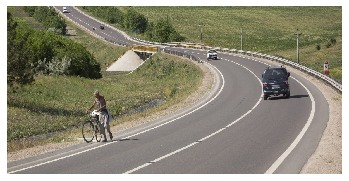

Normal


In [67]:
predict_image('road001.jpg')

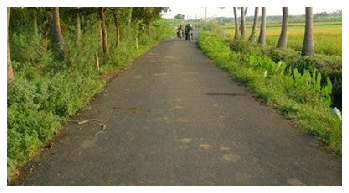

Normal


In [68]:
predict_image('road002.jpg')

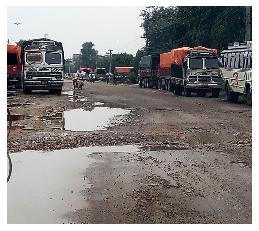

Pothole


In [69]:
predict_image('road003.jpg')

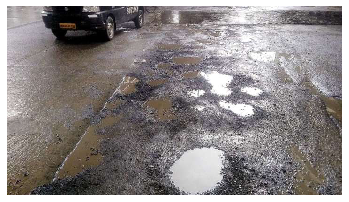

Pothole


In [70]:
predict_image('road004.jpg')

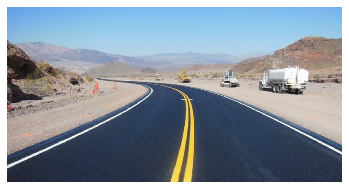

Normal


In [71]:
predict_image('Dataset/normal004.jpg')

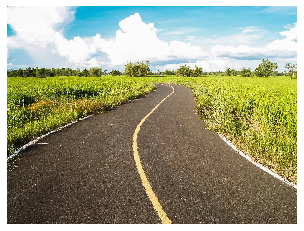

Normal


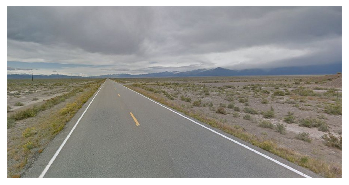

Normal


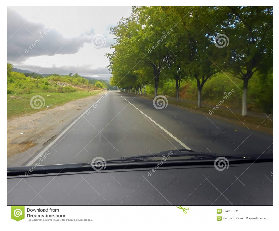

Normal


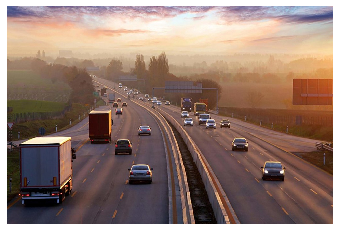

Normal


In [72]:
predict_image('Dataset/normal005.jpg')
predict_image('Dataset/normal002.jpg')
predict_image('Dataset/normal007.jpg')
predict_image('Dataset/normal008.jpg')


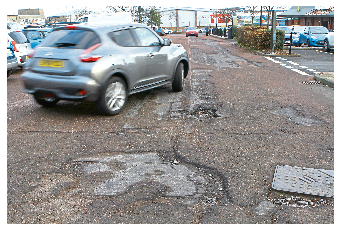

Pothole


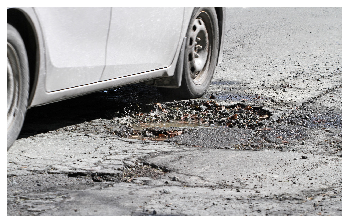

Pothole


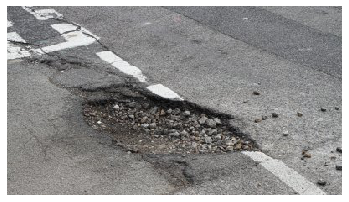

Pothole


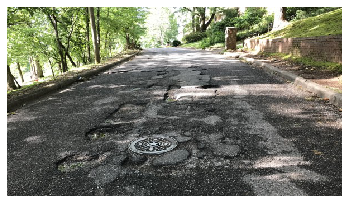

Pothole


In [73]:
predict_image('Dataset/pothole005.jpg')
predict_image('Dataset/pothole002.jpg')
predict_image('Dataset/pothole007.jpg')
predict_image('Dataset/pothole008.jpg')